<img src="https://www.uc3m.es/ss/Satellite?blobcol=urldata&blobkey=id&blobtable=MungoBlobs&blobwhere=1371573952659">

---

# WEB ANALYTICS COURSE 4 - SEMESTER 2 
# BACHELOR IN DATA SCIENCE AND ENGINEERING 

# LAB DATA VISUALIZATION IN THE WEB

---


In this block we will use data from the *Instituto Nacional de Estadística* [INE](https://www.ine.es/index.htm). We will be focus on the Tourism Sector.

We are going to analyze the tourism from two points of view. On the one hand, we are going to use the data that give us information on the history of travel in Spain. On the other hand, we will analyze employment in the tourism sector. You can visit the INE website for more information about the datasets. But in this [folder](https://drive.google.com/file/d/13Jhw6LWyja1z1be3bFKAWOh5KeM3XuqZ/view?usp=sharing) you can find the files that we will use in the labs. 

# Lab1: Data Processing and Visualization in Python 

## 0. Lab Preparation

1.  Study and have clear the concepts explained in the theoretical class and the introductory lab. 

2.   Gain experience with the use of the [Pandas](https://pandas.pydata.org/), [Matplotlib](https://matplotlib.org/) and [Folium](https://python-visualization.github.io/folium/). The exercises of this lab will be mainly based on the utilization of functions offered by these libraries for data cleaning and data processing. 

3. It is assumed students have experience in using Python notebooks. Either a local installation (e.g., local python installation + Jupyter) or a cloud-based solution (e.g., Google Colab). *We recommend the second option*.

## 1. Lab Introduction

* In this lab, we will prepare our dataset for later analysis and visualization using [Pandas](https://pandas.pydata.org/), [Matplotlib](https://matplotlib.org/) and [Folium](https://python-visualization.github.io/folium/).

* The lab will be done in groups of 2 people.

* The lab defines a set of milestones the students must complete. Upon completing every milestone, students should call the professor, who will check the correctness of the solution (*If the professor is busy, do not wait for them, move to the next milestone*).

* **The final mark will be computed as a function of the number of milestones successfully completed.**

* **Each group should also share their lab notebook with the professor upon the finalization of the lab.**

- It is recommended to use [Google Colab](https://colab.research.google.com/) to produce the Python notebook with the solution of the lab. Of course, if any student prefers using its local programming environment (e.g., jupyter) and python installation, they are welcome to do so. 

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


### Reading the Data

In [2]:
# We will upload the zip file to Google Colab, and then unzip them using the following code:

!unzip '/content/INE_ddbbs_DataVis_lab.zip'


Archive:  /content/INE_ddbbs_DataVis_lab.zip
  inflating: INE_tourism/Número de turistas según motivo principal del viaje.csv  
  inflating: INE_tourism/Número de turistas según comunidad autónoma de destino principal.csv  
  inflating: INE_employment/Ocupados por sexo y rama de actividad. Valores absolutos y porcentajes respecto del total de cada sexo.csv  
  inflating: INE_tourism/Viajes, pernoctaciones, duración media y gasto por comunidad autónoma de residencia de los viajeros.csv  
  inflating: INE_tourism/Viajes con destino principal interno, pernoctaciones, duración media y gasto por tipo de destino principal, según comunidad autónoma de residencia de los viajeros.csv  
  inflating: INE_employment/Ocupados por rama de actividad, sexo y comunidad autónoma.csv  


## Milestone 1

1. Load the datasets about tourism ([INE_tourism](https://drive.google.com/file/d/13Jhw6LWyja1z1be3bFKAWOh5KeM3XuqZ/view?usp=sharing)) into dataframes
2. Prepare the data for later analysis, that is:
  * Split the column *Periodo* in *Year* and *Quarter* or *Month*.
  * Transform column numbers that are identified as Objects by Python to numbers. (Print *dtypes* of your dataframes to check it is done correctly).
  * Extract the Autonomous Community (CCAA) from the corresponding column.
  



In [3]:
import pandas as pd

# we will load all the different dataframes from the INE_tourism folder. 
# we use some parameters so as to not get errors when reading the code. We select \t as the separator and , to be the decimal value.

df_tourism1=pd.read_csv('INE_tourism/Número de turistas según comunidad autónoma de destino principal.csv', error_bad_lines=False, sep='\t', decimal=',' ,thousands=',')
df_tourism2=pd.read_csv('INE_tourism/Número de turistas según motivo principal del viaje.csv',error_bad_lines=False, sep='\t')
df_tourism3=pd.read_csv('INE_tourism/Viajes con destino principal interno, pernoctaciones, duración media y gasto por tipo de destino principal, según comunidad autónoma de residencia de los viajeros.csv',error_bad_lines=False, sep='\t')
df_tourism4=pd.read_csv('INE_tourism/Viajes, pernoctaciones, duración media y gasto por comunidad autónoma de residencia de los viajeros.csv',error_bad_lines=False, sep='\t')


### Modifying the dataframes.

From now on, we will apply preprocessing to the previous dataframes and will modify the columns accordingly.

In [4]:
# first off, we create a fucntion that given a value x, and a parameter, returns the first or 
# second parameter of the string. 
# The split_val is either an M or a T, which varies depending on the dataframe we are using. 
# this function will be used in our dataframes with the pandas.apply() method.

def get_date(x, year, split_val='M'):
  if year==True:
    return x.split(split_val)[0]
  return x.split(split_val)[1]


In [5]:
# Split the column Periodo in Year and Quarter or Month.

# now, we create a function that, given a dataframe, returns a modified dataframe with several modifications.
# The Year column is modified to get the date: (2015, 2016, ...)
# the Month or Quarter column is modified so that it returns the value we want: (08, 01, ...) 
# of course, depending on the columns. If the separator is an M, then the values range from 
# 1 to 12. If the separator is Q, then the values range from 1 to 4.

def modify_df(df, name_col, split_val):
  df['Year']=df['Periodo'].apply(get_date, year=True,split_val=split_val)
  df[name_col]=df['Periodo'].apply(get_date, year=False,split_val=split_val)
  df.drop(columns=['Periodo'],inplace=True)
  return df

df_tourism1=modify_df(df_tourism1, name_col='Month', split_val='M')
df_tourism2=modify_df(df_tourism2, name_col='Month', split_val='M')
df_tourism3=modify_df(df_tourism3, name_col='Quarter', split_val='T')
df_tourism4=modify_df(df_tourism4, name_col='Quarter', split_val='T')

# there are the modified dataframes, with the same given name as before, but with the 
# different values modified.

In [6]:
# Transform column numbers that are identified as Objects by Python to numbers. 
# (Print dtypes of your dataframes to check it is done correctly).

# now we follow a similar approach and define two functions. One returns an numeric value for 
# the numbers of the Total column. This column has a difficult notation, as some of the numbers with
# a lot of digits are expressed in the form: x.xxx.xxx, for example: 2.333.256, which makes it
# hard for us to create an algorithm that parses that data correctly. 
# In the first function, we first convert the input to a string, then we replace the decimal dots 
# with an empty character so that the numbers would be transformed from 2.333.256 to 233256. 
# For those non integer values, the comma is turned into a decimal point so that python 
# can interpret them as numeric values. 
# all in all, we convert numbers of the form 2.333.256,342 to 2333256.342 

def get_num(x):
  x = str(x)
  x = x.replace('.', '').replace(',','.')
  try:
    float(x)
    return float(x)
  except:
    return 0

def change_to_int(df, col_name):
  df['Total'] = df['Total'].apply(get_num)
  df['Year'] = df['Year'].astype('int')
  df[col_name] = df[col_name].astype('int')
  return df

df_tourism1 = change_to_int(df_tourism1, 'Month')
df_tourism2 = change_to_int(df_tourism2, 'Month')

df_tourism3 = change_to_int(df_tourism3, 'Quarter')
df_tourism4 = change_to_int(df_tourism4, 'Quarter')

# we then modify the dataframes just as we did before and obtain numeric values 
# for the columns:
df_tourism4.dtypes


Comunidad autónoma de residencia     object
Concepto turístico                   object
Tipo de dato                         object
Total                               float64
Year                                  int64
Quarter                               int64
dtype: object

In [7]:
df_tourism3['Comunidad autónoma de residencia'].unique()

# now, we will explore yet another column of our dataframe in order to check for the 
# CCAA. We use the pandas unique() function to retrieve all the unique parameters.

array(['Total', '01 Andalucía', '02 Aragón', '03 Asturias, Principado de',
       '04 Balears, Illes', '05 Canarias', '06 Cantabria',
       '07 Castilla y León', '08 Castilla - La Mancha', '09 Cataluña',
       '10 Comunitat Valenciana', '11 Extremadura', '12 Galicia',
       '13 Madrid, Comunidad de', '14 Murcia, Región de',
       '15 Navarra, Comunidad Foral de', '16 País Vasco', '17 Rioja, La',
       '18 Ceuta', '19 Melilla'], dtype=object)

In [8]:
# Extract the Autonomous Community (CCAA) from the corresponding column.
# Again, we define two functions that return the name of the CCAA depending on the input data.
# For each dataframe, the data is different so that is why different funcitons are needed.

# the first one returns the value with the given string separated by comma.
# the second function does a similar thing but takes many more things into account,
# like if the string has more than one comma, if there are articles before the name and so on.
# For the first one, strings like "10 Asturias, Principado de" would not work, but they would 
# for the second one. So that is why there are two different functions.

def get_comunidad(x):
  if x=='Total' or x=='Otras Comunidades Autónomas':
    return x
  return x.split(' ')[1]


def get_comunidad_extended(x):
  if x=='Total':
    return x
  else:
    if ',' in x:
      split_list = x.split(', ')
      second_split = split_list[0].split(' ')[1]
      return ' '.join((split_list[1], second_split))
    else:
      split_list = x.split(' ')
      if len(split_list) == 2:
        return x.split(' ')[1]
      else:
        if 'Castilla' not in x:
          return ' '.join((split_list[1], split_list[2]))
        elif 'Castilla -' in x:
          return 'Castilla - La Mancha'
        else:
          return 'Castilla y León'

df_tourism1['Comunidades autónomas'] = df_tourism1['Comunidades autónomas'].apply(get_comunidad)
df_tourism3['Comunidad autónoma de residencia'] = df_tourism3['Comunidad autónoma de residencia'].apply(get_comunidad_extended)
df_tourism4['Comunidad autónoma de residencia'] = df_tourism4['Comunidad autónoma de residencia'].apply(get_comunidad_extended)

# following the same procedure as before, we can apply these functions to the respective
# columns and modify the previous ones.

In [9]:
df_tourism3['Comunidad autónoma de residencia'].unique()

array(['Total', 'Andalucía', 'Aragón', 'Principado de Asturias',
       'Illes Balears', 'Canarias', 'Cantabria', 'Castilla y León',
       'Castilla - La Mancha', 'Cataluña', 'Comunitat Valenciana',
       'Extremadura', 'Galicia', 'Comunidad de Madrid',
       'Región de Murcia', 'Comunidad Foral de Navarra', 'País Vasco',
       'La Rioja', 'Ceuta', 'Melilla'], dtype=object)

## Milestone 2

1. Load the datasets about employment ([INE_employment](https://drive.google.com/file/d/13Jhw6LWyja1z1be3bFKAWOh5KeM3XuqZ/view?usp=sharing)) into dataframes
2. Prepare the data for later analysis, that is:
  * Split the column *Periodo* in *Year* and *Quarter* or *Month*. 
  * Transform column numbers that are identified as Objects by Python to numbers. (Print *dtypes* of your dataframes to check it is done correctly).
  * Extract the Autonomous Community (CCAA) from the corresponding column.
  * Extract CNAE Code from column *Rama de actividad CNAE 2009* by using regular expressions. 
  * Filter the dataframes by leaving only the activities considered in the frame of tourism (See the list below). 
  To filter the dataframes, you must first understand how the CNAE codes work. Once you have understood this, you must apply regular expressions to extract the corresponding letter or code.  Based on that, you must filter the table so that the filter of letters or codes is inclusive, i.e., it fits as much as possible to the list below but includes all the options, this means that some of the selections you have to make will be wider. 

---


```
The economic activities considered in the delimitation of the scope of Tourism acording to TourSpain are the following (the corresponding code of the CNAE 2009 is included):

* 55 y 56 Hostelería
* 491 Transporte interurbano de pasajeros por ferrocarril
* 493 Otro transporte terrestre de pasajeros
* 501 Transporte marítimo de pasajeros
* 503 Transporte de pasajeros por vías navegables interiores
* 511 Transporte aéreo de pasajeros
* 522 Actividades anexas al transporte
* 791 Actividades de agencias de viajes y operadores turísticos
* 799 Otros servicios de reservas y actividades relacionadas con los mismos
* 771 Alquiler de vehículos de motor
* 773 Alquiler de otra maquinaria, equipos y bienes tangibles
* 900 Actividades de creación, artísticas y espectáculos
* 910 Actividades de bibliotecas, archivos, museos y otras actividades culturales
* 931 Actividades deportivas
* 932 Actividades recreativas y de entretenimiento
```
 

In [10]:
# we read the dataframes once again, with the same separators as before.

df_employ1=pd.read_csv('INE_employment/Ocupados por rama de actividad, sexo y comunidad autónoma.csv', error_bad_lines=False, sep='\t')
df_employ2=pd.read_csv('INE_employment/Ocupados por sexo y rama de actividad. Valores absolutos y porcentajes respecto del total de cada sexo.csv', error_bad_lines=False, sep='\t')


In [11]:
# Split the column Periodo in Year and Quarter or Month.

# we use the funcitons defined at the begginning.

df_employ1=modify_df(df_employ1, name_col='Quarter', split_val='T')
df_employ2=modify_df(df_employ2, name_col='Quarter', split_val='T')


In [12]:
# we can take a sample of the data.

df_employ2.head()

,Rama de actividad CNAE 2009,Sexo,Unidad,Total,Year,Quarter
0,Total,Ambos sexos,Valor absoluto,20.031,2021,3
1,Total,Ambos sexos,Valor absoluto,"19.671,7",2021,2
2,Total,Ambos sexos,Valor absoluto,"19.206,8",2021,1
3,Total,Ambos sexos,Valor absoluto,"19.344,3",2020,4
4,Total,Ambos sexos,Valor absoluto,"19.176,9",2020,3


In [13]:
# Transform column numbers that are identified as Objects by Python to numbers. 
#(Print dtypes of your dataframes to check it is done correctly).

# again, we follow the procedure we saw before.

df_employ1 = change_to_int(df_employ1, 'Quarter')
df_employ1 = change_to_int(df_employ1, 'Total')
df_employ2 = change_to_int(df_employ2, 'Quarter')
df_employ2 = change_to_int(df_employ2, 'Total')


print(df_employ1.dtypes, df_employ2.dtypes)

Sexo                                object
Comunidades y Ciudades Autónomas    object
Rama de actividad CNAE 2009         object
Total                                int64
Year                                 int64
Quarter                              int64
dtype: object Rama de actividad CNAE 2009    object
Sexo                           object
Unidad                         object
Total                           int64
Year                            int64
Quarter                         int64
dtype: object


In [14]:
# once more, when we want to estract the name of the CCAA, we print
# the values beforehand so that we see what we are working with.

df_employ1['Comunidades y Ciudades Autónomas'].unique()

array(['Total Nacional', '01 Andalucía', '02 Aragón',
       '03 Asturias, Principado de', '04 Balears, Illes', '05 Canarias',
       '06 Cantabria', '07 Castilla y León', '08 Castilla - La Mancha',
       '09 Cataluña', '10 Comunitat Valenciana', '11 Extremadura',
       '12 Galicia', '13 Madrid, Comunidad de', '14 Murcia, Región de',
       '15 Navarra, Comunidad Foral de', '16 País Vasco', '17 Rioja, La',
       '18 Ceuta', '19 Melilla'], dtype=object)

In [15]:
# Extract the Autonomous Community (CCAA) from the corresponding column.

# in this case, we define another function, similar to get_comunidad_extended,
# but with different hard-coded examples.

def get_comunidad(x):
  if x=='Total Nacional':
    return x
  else:
    if ',' in x:
      split_list = x.split(', ')
      second_split = split_list[0].split(' ')[1]
      return ' '.join((split_list[1], second_split))
    else:
      split_list = x.split(' ')
      if len(split_list) == 2:
        return x.split(' ')[1]
      else:
        if 'Castilla' not in x:
          return ' '.join((split_list[1], split_list[2]))
        elif 'Castilla -' in x:
          return 'Castilla - La Mancha'
        else:
          return 'Castilla y León'

df_employ1['Comunidades y Ciudades Autónomas'] = df_employ1['Comunidades y Ciudades Autónomas'].apply(get_comunidad)
df_employ1['Comunidades y Ciudades Autónomas'].unique()

# we can see that the values are different and are the correct ones.

array(['Total Nacional', 'Andalucía', 'Aragón', 'Principado de Asturias',
       'Illes Balears', 'Canarias', 'Cantabria', 'Castilla y León',
       'Castilla - La Mancha', 'Cataluña', 'Comunitat Valenciana',
       'Extremadura', 'Galicia', 'Comunidad de Madrid',
       'Región de Murcia', 'Comunidad Foral de Navarra', 'País Vasco',
       'La Rioja', 'Ceuta', 'Melilla'], dtype=object)

In [16]:
# Extract CNAE Code from column Rama de actividad CNAE 2009 by using regular expressions.

# we will take a look once more at the column to see the values.

df_employ1['Rama de actividad CNAE 2009'].unique()

array(['Total', 'A Agricultura', 'Total Industria ( B + C + D + E )',
       'B_E Industrias extractivas; suministro de energía eléctrica, gas, vapor y  aire acondicionado; suministro de agua, actividades de saneamiento, gestión de residuos y descontaminación  ( B + D + E )',
       'C Industria manufacturera', 'F Construcción',
       'Comercio al por mayor y al por menor, reparación de vehículos de motor y motocicletas; transporte y almacenamiento; hostelería ( G + H + I )',
       'J Información y comunicaciones',
       'K Actividades financieras y de seguros',
       'L Actividades inmobiliarias',
       'Actividades profesionales, científicas y técnicas; actividades administrativas y servicios auxiliares ( M + N )',
       'Administración Pública y defensa, Seguridad social obligatoria; educación; actividades sanitarias y de servicios sociales ( O + P + Q )',
       'Activ. artísticas, recreativas y de entretenimiento; hogares como empleadores domésticos y como productores de bie

In [17]:
df_employ2['Rama de actividad CNAE 2009'].unique()

array(['Total', 'A Agricultura, ganadería, silvicultura y pesca',
       '01 Agricultura, ganadería, caza y servicios relacionados con las mismas',
       '02 Silvicultura y explotación forestal', '03 Pesca y acuicultura',
       'B Industrias extractivas',
       '05 Extracción de antracita, hulla y lignito',
       '06 Extracción de crudo de petróleo y gas natural',
       '07 Extracción de minerales metálicos',
       '08 Otras industrias extractivas',
       '09 Actividades de apoyo a las industrias extractivas',
       'C Industria manufacturera', '10 Industria de la alimentación',
       '11 Fabricación de bebidas', '12 Industria del tabaco',
       '13 Industria textil', '14 Confección de prendas de vestir',
       '15 Industria del cuero y del calzado',
       '16 Industria de la madera y del corcho, excepto muebles; cestería y espartería',
       '17 Industria del papel',
       '18 Artes gráficas y reproducción de soportes grabados',
       '19 Coquerías y refino de petróleo'

In [18]:
# Extract CNAE Code from column Rama de actividad CNAE 2009 by using regular expressions.

# we will define a function that finds all the numeric values and returns the first parameter
# of the string, wether it be a letter or a number. 
# these values will be used to determine wether or not an activity is considered tourism or not.

import re

def get_CNAE_code(x):
  numbers = re.findall('[0-9]+', x)
  if len(numbers)>0:
    return numbers[0]
  return x.split(' ')[0]

df_employ2['CNAE Code']=df_employ2['Rama de actividad CNAE 2009'].apply(get_CNAE_code)


In [19]:
# we can print the codes of the data.

df_employ2['CNAE Code'].unique()

array(['Total', 'A', '01', '02', '03', 'B', '05', '06', '07', '08', '09',
       'C', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30',
       '31', '32', '33', 'D', '35', 'E', '36', '37', '38', '39', 'F',
       '41', '42', '43', 'G', '45', '46', '47', 'H', '49', '50', '51',
       '52', '53', 'I', '55', '56', 'J', '58', '59', '60', '61', '62',
       '63', 'K', '64', '65', '66', 'L', '68', 'M', '69', '70', '71',
       '72', '73', '74', '75', 'N', '77', '78', '79', '80', '81', '82',
       'O', '84', 'P', '85', 'Q', '86', '87', '88', 'R', '90', '91', '92',
       '93', 'S', '94', '95', '96', 'T', '97', '98', 'U', '99'],
      dtype=object)

In [20]:
df_employ2['CNAE Code'].unique()


groups = {
    'Total': 'Total',
    'GROUP A': ['A', '01', '02', '03'],
    'GROUP B': ['B', '05', '06', '07', '08', '09'],
    'GROUP C': ['C', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33'],
    'GROUP D': ['D', '35',],
    'GROUP E': ['E', '36', '37', '38', '39'],
    'GROUP F': ['F','41', '42', '43', 'G', '45', '46', '47'],
    'GROUP G': ['G', '45', '46', '47'],
    'GROUP H': ['H', '49', '50', '51', '52', '53'],
    'GROUP I': ['I', '55', '56'],
    'GROUP J': ['J', '58', '59', '60', '61', '62', '63'],
    'GROUP K': ['K', '64', '65', '66'],
    'GROUP L': ['L', '68'],
    'GROUP M': ['M', '69', '70', '71', '72', '73', '74', '75'],
    'GROUP N': ['N', '77', '78', '79', '80', '81', '82'],
    'GROUP O': ['O', '84'],
    'GROUP P': ['P', '85'],
    'GROUP Q': ['Q', '86', '87', '88'],
    'GROUP R': ['R', '90', '91', '92','93'],
    'GROUP S': ['S', '94', '95', '96'],
    'GROUP T': ['T', '97', '98'],
    'GROUP U': ['U', '99']}


def classify_into_groups(x):
  for key in list(groups.keys()):
    if x in groups[key]:
      return key

# nowe we define a dictionary with all the different gropus and numbers assigned to each
# group. We check if the CNAE Code we are using is within the keys of the dictionary and 
# then return the key of the GROUP.

df_employ2['FINAL GROUPS'] = df_employ2['CNAE Code'].apply(classify_into_groups)
df_employ2['FINAL GROUPS'].value_counts()



GROUP C    8250
GROUP M    2640
GROUP F    2640
GROUP J    2310
GROUP N    2310
GROUP H    1980
GROUP B    1980
GROUP E    1650
GROUP R    1650
GROUP Q    1320
GROUP S    1320
GROUP K    1320
GROUP A    1320
GROUP I     990
GROUP U     660
Total       660
GROUP O     660
GROUP T     660
GROUP P     660
GROUP D     660
GROUP L     660
Name: FINAL GROUPS, dtype: int64

In [21]:
# we will create a list with all the different values of Tourism so that we can iterate throught the values of 
# the list and check if any of the values in the CNAE column are equal to those of the list:

list_values = ['55 y 56 Hostelería',
               '491 Transporte interurbano de pasajeros por ferrocarril',
               '493 Otro transporte terrestre de pasajeros',
               '501 Transporte marítimo de pasajeros',
               '503 Transporte de pasajeros por vías navegables interiores',
               '511 Transporte aéreo de pasajeros',
               '522 Actividades anexas al transporte',
               '791 Actividades de agencias de viajes y operadores turísticos',
               '799 Otros servicios de reservas y actividades relacionadas con los mismos',
               '771 Alquiler de vehículos de motor',
               '773 Alquiler de otra maquinaria, equipos y bienes tangibles',
               '900 Actividades de creación, artísticas y espectáculos',
               '910 Actividades de bibliotecas, archivos, museos y otras actividades culturales',
               '931 Actividades deportivas',
               '932 Actividades recreativas y de entretenimiento']


In [22]:
"""
Filter the dataframes by leaving only the activities considered in the frame of tourism (See the list below). To filter the dataframes, you must first understand 
how the CNAE codes work. Once you have understood this, you must apply regular expressions to extract the corresponding letter or code. 
Based on that, you must filter the table so that the filter of letters or codes is inclusive, i.e., it fits as much as possible to the list below but includes 
all the options, this means that some of the selections you have to make will be wider.
"""


# now that we have a column with all the CNAE codes, we just need to select those that are within the mentioned list
# also, we have to check if any of the mentioned terms in the 'Rama de actividad CNAE 2009' column match any of the 
# given terms in our list of values.

# we follow the standard procedure we have been using and create an apply function to our data.


def is_tourism(x):
  if x == 'Total':
    return False
  if x.split(' ')[1] in ['H', 'I', 'J', 'M', 'N', 'R', 'S', 'T', 'U']:
    return True 
  return False

df_employ2['is_tourism'] = df_employ2['FINAL GROUPS'].apply(is_tourism)
new_df = df_employ2[df_employ2['is_tourism'] == True]

new_df = new_df.sample(100)
new_df

# we define a new dataframe with the tourism values only.

,Rama de actividad CNAE 2009,Sexo,Unidad,Total,Year,Quarter,CNAE Code,FINAL GROUPS,is_tourism
34122,"95 Reparación de ordenadores, efectos personal...",Hombres,Valor absoluto,415,2016,1,95,GROUP S,True
27714,78 Actividades relacionadas con el empleo,Mujeres,Porcentaje,2,2009,2,78,GROUP N,True
18903,I Hostelería,Ambos sexos,Porcentaje,71,2012,1,I,GROUP I,True
19182,55 Servicios de alojamiento,Ambos sexos,Valor absoluto,3176,2011,1,55,GROUP I,True
32996,92 Actividades de juegos de azar y apuestas,Mujeres,Porcentaje,4,2008,4,92,GROUP R,True
...,...,...,...,...,...,...,...,...,...
27300,77 Actividades de alquiler,Mujeres,Valor absoluto,128,2016,3,77,GROUP N,True
18434,52 Almacenamiento y actividades anexas al tran...,Mujeres,Porcentaje,6,2019,2,52,GROUP H,True
21187,61 Telecomunicaciones,Ambos sexos,Porcentaje,6,2018,3,61,GROUP J,True
27782,"79 Actividades de agencias de viajes, operador...",Ambos sexos,Porcentaje,4,2019,4,79,GROUP N,True


## Milestone 3

Now, we will visualize our pre-processed datasets using [Matplotlib](https://matplotlib.org/) and [Seaborn](https://seaborn.pydata.org/). You can choose one or both libraries for this milestones.  

*Note that you may need to modify/reshape the dataframe to accommodate the data for the visualization part*. 

1. Plot a bar graph of employed people in the toursim sector by activity (CNAE classification) for both sexs, in absolute values and splitted by years. 
2. Plot a bar graph of employed people in the toursim sector by year, sex and CCAA. 
3. Plot a boxplot graph containing the monthly data of number of turists by CCAA.  

In [23]:
import matplotlib.pyplot as plt


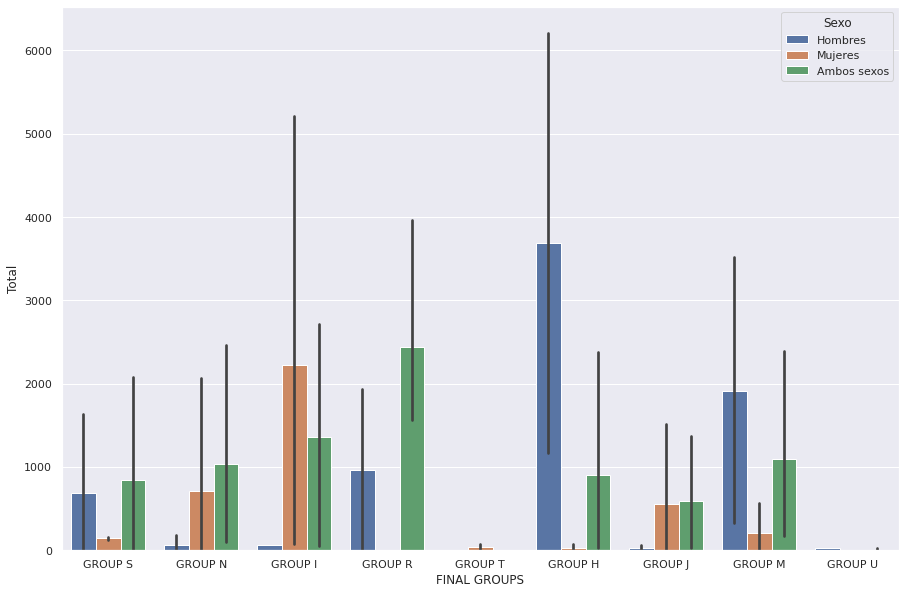

In [24]:
# Plot a bar graph of employed people in the toursim sector by activity (CNAE classification) for both sexs, in absolute values and splitted by years.

# we will use the seaborn library.
# we will select the FINAL GROUPS column of the data as well as the one containing the 
# total number of values, i.e., Total. 
# we select the hue equal to Sexo so that we see all the distinct values.

import seaborn as sns
sns.set_theme(style='whitegrid')
sns.set(rc={'figure.figsize':(15, 10)})

sns.barplot(x='FINAL GROUPS', y='Total', hue='Sexo', data = new_df)

In [25]:
# now we create yet another dataframe but we select only the ones related to hostelería.
# we use the first employment dataframe as it contains the necessary information.

new_df_1 = df_employ1[df_employ1['Rama de actividad CNAE 2009'] == 'Comercio al por mayor y al por menor, reparación de vehículos de motor y motocicletas; transporte y almacenamiento; hostelería ( G + H + I )']

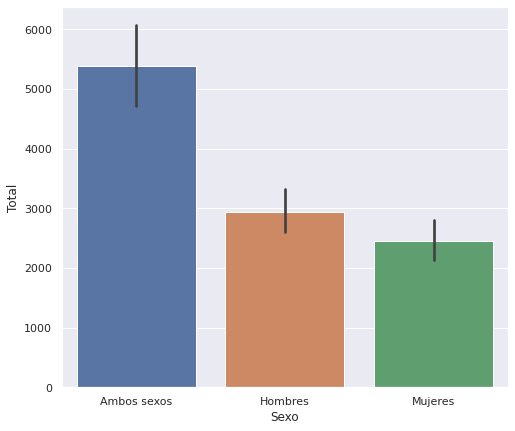

In [26]:
# Plot a bar graph of employed people in the toursim sector by sex 

sns.set(rc={'figure.figsize':(8, 7)})

sns.barplot(x='Sexo', y='Total', data = new_df_1)

# we can see that more Men are employed in the tourism sector.

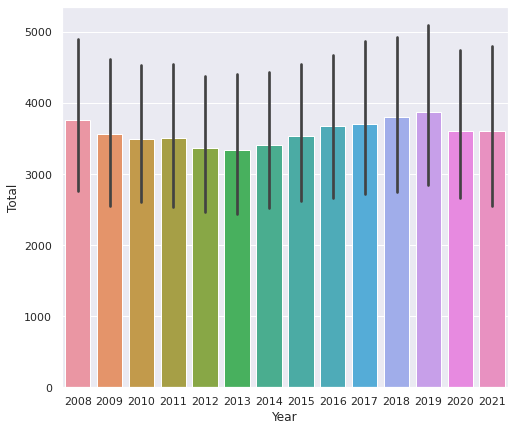

In [27]:
# Plot a bar graph of employed people in the toursim sector by year

sns.barplot(x='Year', y='Total', data = new_df_1)

# we can interpret that the data is kind of stable among the years, decreasing a little in 2020 and
# 2021 presumably due to COVID-19.


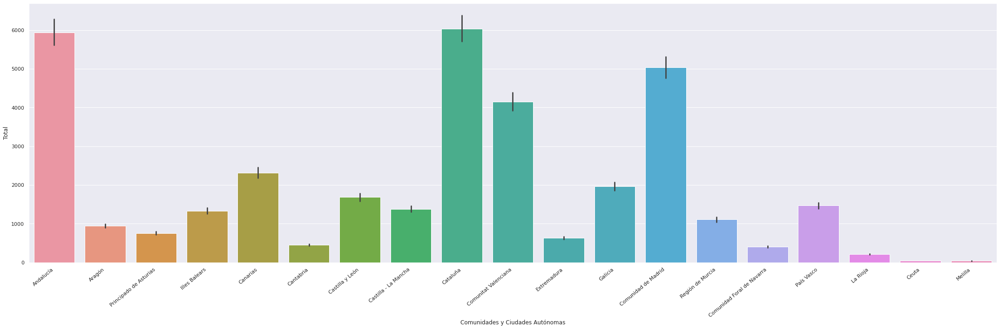

In [28]:
# Plot a bar graph of employed people in the toursim sector by CCAA

new_df_1 = new_df_1[new_df_1['Comunidades y Ciudades Autónomas'] != 'Total Nacional']

sns.set(rc={'figure.figsize':(30, 10)})

ax = sns.barplot(x='Comunidades y Ciudades Autónomas', y='Total', data = new_df_1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

# for this last plot, we rotate the x-axis labels so that it appears on the screen and
# is visible and readable.

# we can see that Andalucia, Cataluña and Madrid are the regions in which more people
# are employed in the tourism sector, which makes sense seeing as they receive a lot
# of tourists.


In [29]:
df_employ1.head()

,Sexo,Comunidades y Ciudades Autónomas,Rama de actividad CNAE 2009,Total,Year,Quarter
0,Ambos sexos,Total Nacional,Total,200310,2021,3
1,Ambos sexos,Total Nacional,Total,196717,2021,2
2,Ambos sexos,Total Nacional,Total,192068,2021,1
3,Ambos sexos,Total Nacional,Total,193443,2020,4
4,Ambos sexos,Total Nacional,Total,191769,2020,3


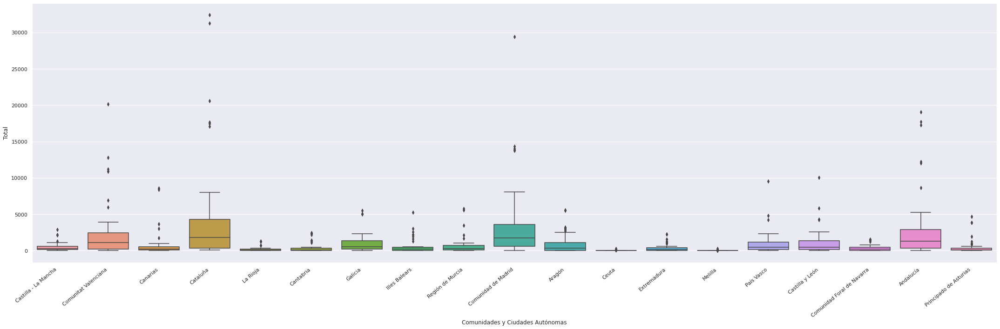

In [30]:
# Plot a boxplot graph containing the monthly data of number of turists by CCAA.

# we select a sample of the data, as it would be too much to handle if we did not.
# we again plot the boxplot. We can see that Valencia, Cataluña or Andalucía stand out among
# the other communities, as they are widely known for the number of tourism they have.

new_df_employ1 = df_employ1[df_employ1['Comunidades y Ciudades Autónomas'] != 'Total Nacional'].sample(1000)
ax = sns.boxplot(y = 'Total', x = 'Comunidades y Ciudades Autónomas',data = new_df_employ1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

## Milestone 4

1. Plot a line plot representing the variation across time of the number of turists by reason for the trip.
2. Plot the time series of the total and average expenses by CCAA of residency for those trips within the Autonomous Community and outside (*Dentro de la Comunidad Autónoma* and *A otra Comunidad Autónoma*).

*Note that you may need to modify/reshape the dataframe to accommodate the data for the visualization part*. 

In [31]:
df_tourism2

,Motivo del viaje,Tipo de dato,Total,Year,Month
0,Total,Dato base,4691486.00,2021,9
1,Total,Dato base,5194212.00,2021,8
2,Total,Dato base,4395384.00,2021,7
3,Total,Dato base,2215710.00,2021,6
4,Total,Dato base,1363624.00,2021,5
...,...,...,...,...,...
1147,Otros motivos,Tasa de variación acumulada,38.85,2016,2
1148,Otros motivos,Tasa de variación acumulada,46.29,2016,1
1149,Otros motivos,Tasa de variación acumulada,NaN,2015,12
1150,Otros motivos,Tasa de variación acumulada,NaN,2015,11


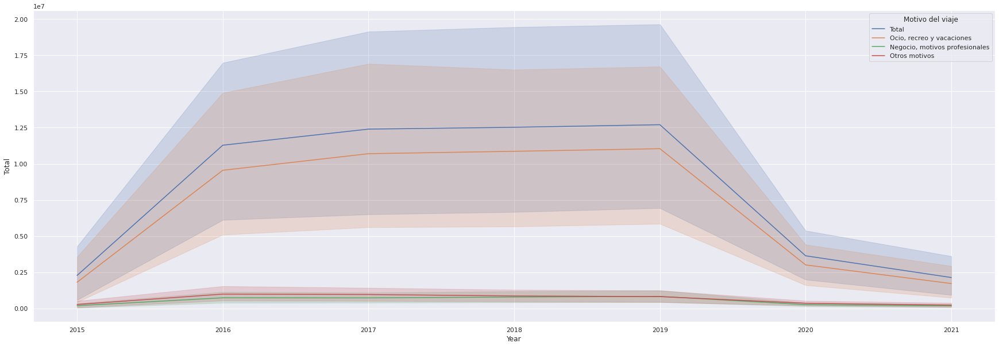

In [32]:
# Plot a line plot representing the variation across time of the number of turists by reason for the trip.

# we use the second dataframe of the tourism data and plot the Total against the Year

sns.lineplot(x='Year', y='Total', hue='Motivo del viaje', data=df_tourism2)

# it is clear to see that Ocio and recreo is the biggest reason.

In [33]:
new_df_3 = df_tourism3[df_tourism3['Tipo de destino'].isin(['Dentro de la Comunidad Autónoma','A otra Comunidad Autónoma'])]
new_df_3

# now we create yet another dataframe for the next exercise. 


,Comunidad autónoma de residencia,Tipo de destino,Concepto turístico,Tipo de dato,Total,Year,Quarter
936,Total,Dentro de la Comunidad Autónoma,Viajes,Valor absoluto,22020786.0,2021,2
937,Total,Dentro de la Comunidad Autónoma,Viajes,Valor absoluto,11605884.0,2021,1
938,Total,Dentro de la Comunidad Autónoma,Viajes,Valor absoluto,11990306.0,2020,4
939,Total,Dentro de la Comunidad Autónoma,Viajes,Valor absoluto,24075182.0,2020,3
940,Total,Dentro de la Comunidad Autónoma,Viajes,Valor absoluto,6688860.0,2020,2
...,...,...,...,...,...,...,...
56155,Melilla,A otra Comunidad Autónoma,Gasto medio diario por persona,Variación anual del acumulado en lo que va de año,0.0,2016,1
56156,Melilla,A otra Comunidad Autónoma,Gasto medio diario por persona,Variación anual del acumulado en lo que va de año,NaN,2015,4
56157,Melilla,A otra Comunidad Autónoma,Gasto medio diario por persona,Variación anual del acumulado en lo que va de año,NaN,2015,3
56158,Melilla,A otra Comunidad Autónoma,Gasto medio diario por persona,Variación anual del acumulado en lo que va de año,NaN,2015,2


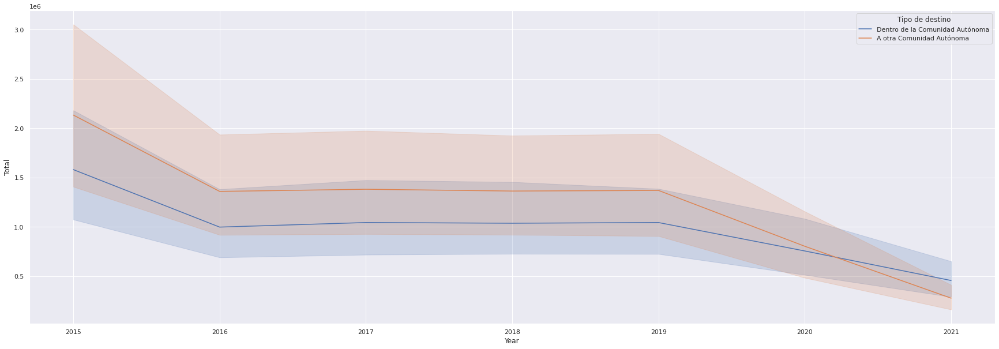

In [34]:
# Plot the time series of the total and average expenses by CCAA of residency for those trips within the Autonomous Community 
# and outside (Dentro de la Comunidad Autónoma and A otra Comunidad Autónoma).

# we use the previously created dataframe and plot the total vs the Year.

sns.lineplot(x='Year', y='Total', hue='Tipo de destino',data = new_df_3)

## Milestone 5

1. Create an interactive map with information about the number of trips, the average duration of the trips, and expenses by CCAA of residency in the last year. It must be a choropleth map based on the number of trips. 

For this milestone, you need to create a map using the [Folium](https://python-visualization.github.io/folium/) library. You also need to download the boundaries (GeoJson) of the Spanish CCAAs. There are many resources where you can find this information, one of them is [opendatasoft](https://public.opendatasoft.com/explore/?sort=modified). 

*Note that you may need to modify/reshape the dataframe to accommodate the data for the visualization part*. 

In [35]:
!pip install geopandas
!pip install geojson

     |████████████████████████████████| 1.0 MB 7.6 MB/s 
     |████████████████████████████████| 6.3 MB 29.9 MB/s 
     |████████████████████████████████| 15.4 MB 39 kB/s 


In [60]:
# We will have to pip install geojson
# We first import the libraries. and load the data

# For this part, we need to import the georef-spain-comunidad-autonoma.geojson file
# that contains information about the different CCAA in Spain and their coordinates.

import pandas as pd
import folium 
from folium.plugins import StripePattern
import geopandas as gpd
import numpy as np
import geojson

with open('georef-spain-comunidad-autonoma.geojson') as f:
    gj = geojson.load(f)
features = gj['features'][0]

geoJSON_df = gpd.read_file('georef-spain-comunidad-autonoma.geojson')

# we read the geojson and store it in a pandas dataframe.

In [61]:

# another dataframe is created. It does not include the value Total within the CCAA.

df = df_tourism3[df_tourism3['Comunidad autónoma de residencia'] != 'Total']
df.head()


,Comunidad autónoma de residencia,Tipo de destino,Concepto turístico,Tipo de dato,Total,Year,Quarter
2808,Andalucía,España,Viajes,Valor absoluto,5273659.0,2021,2
2809,Andalucía,España,Viajes,Valor absoluto,2215646.0,2021,1
2834,Andalucía,España,Viajes,Distribución porcentual,100.0,2021,2
2835,Andalucía,España,Viajes,Distribución porcentual,100.0,2021,1
2860,Andalucía,España,Viajes,Acumulado en lo que va de año,7489305.0,2021,2


In [62]:
# we define an interactive folium Map located and zoomed in spain, with the 
# different values for the autonomous communities outlined.

map = folium.Map(location = [40,-4], zoom_start=6, width=700, height=500, control_scale=True)
ccaa_geojson = r'georef-spain-comunidad-autonoma.geojson'

folium.GeoJson(ccaa_geojson, name='CCAA').add_to(map)

map

Create an interactive map with information about the number of trips, the average duration of the trips, and expenses by CCAA of residency in the last year. It must be a choropleth map based on the number of trips.

In [63]:
df_tourism4 = df_tourism4[df_tourism4['Year']==2021]
df_tourism3 = df_tourism3[df_tourism3['Year']==2021]

df_tourism3 = df_tourism3[df_tourism3['Comunidad autónoma de residencia'] != 'Total']
df_tourism4 = df_tourism4[df_tourism4['Comunidad autónoma de residencia'] != 'Total']


In [86]:
# we will create some dataframes now, including the number of Number of trips, 
# the average duration of the trips, and the expenses by CCAA 

# we start with average duration

def get_new_df(label, final_label):
  df_travel = df_tourism3[df_tourism3['Concepto turístico'] == label]
  df_travel_1 = df_tourism4[df_tourism4['Concepto turístico'] == label]
  df_travel = df_travel.dropna(); df_travel_1 = df_travel_1.dropna()
  df_travel['Total'] = df_travel['Total'].abs();  df_travel_1['Total'] = df_travel_1['Total'].abs()
  df_travel = df_travel.append(df_travel_1)
  df_travel = df_travel.groupby(['Comunidad autónoma de residencia']).mean()
  # we group by the CCAA and obtain a new dataframe with the average time per CCAA.
  df_travel.set_axis([final_label, 'Year', 'Quarter'], axis=1, inplace=True)
  df_travel['CCAA'] = df_travel.index
  df_travel.index = range(len(df_travel))
  return df_travel

df_travel = get_new_df('Viajes', 'Length of Trips')
df_gasto=get_new_df('Gasto medio diario por persona', 'Average Trip Cost')
df_duration=get_new_df('Duración media de los viajes', 'Average Trip Duration')

df_duration

,Average Trip Duration,Year,Quarter,CCAA
0,10.808125,2021.0,1.5,Andalucía
1,6.209063,2021.0,1.5,Aragón
2,6.280000,2021.0,1.5,Canarias
3,11.922187,2021.0,1.5,Cantabria
4,15.562500,2021.0,1.5,Castilla - La Mancha
5,6.191875,2021.0,1.5,Castilla y León
6,5.384062,2021.0,1.5,Cataluña
7,2.894687,2021.0,1.5,Ceuta
8,7.723750,2021.0,1.5,Comunidad Foral de Navarra
9,17.828125,2021.0,1.5,Comunidad de Madrid


In [92]:
def get_names(val):
    if val == 'Ceuta':
      val='Ciudad Autónoma de Ceuta'
    elif val == 'Melilla':
      val='Ciudad Autónoma de Melilla'
    elif val == 'Castilla-La Mancha':
      val = 'Castilla-La Mancha'
    return val

df_gasto['CCAA'] = df_gasto['CCAA'].apply(get_names)
df_travel['CCAA'] = df_travel['CCAA'].apply(get_names)
df_duration['CCAA'] = df_duration['CCAA'].apply(get_names)
final_df = pd.merge(df_duration, df_gasto, on='CCAA', how='outer')
final_df = pd.merge(final_df, df_travel, on='CCAA', how='outer')
final_df.dropna(inplace=True)
final_df = final_df[['CCAA', 'Average Trip Duration', 'Average Trip Cost', 'Length of Trips']]
final_df['CCAA'].replace({"Castilla - La Mancha": "Castilla-La Mancha"}, inplace=True)
final_df

,CCAA,Average Trip Duration,Average Trip Cost,Length of Trips
0,Andalucía,10.808125,37.542500,1.082081e+06
1,Aragón,6.209063,34.814063,2.212840e+05
2,Canarias,6.280000,35.019062,3.136673e+05
3,Cantabria,11.922187,40.404688,8.685886e+04
4,Castilla-La Mancha,15.562500,42.246875,3.531622e+05
5,Castilla y León,6.191875,34.506250,4.394996e+05
6,Cataluña,5.384062,38.463750,1.289345e+06
7,Ciudad Autónoma de Ceuta,2.894687,18.720000,5.615597e+03
8,Comunidad Foral de Navarra,7.723750,41.150000,1.033023e+05
9,Comunidad de Madrid,17.828125,37.711875,9.210373e+05


In [93]:

#final_df = final_df[['CCAA', 'Average Trip Duration', 'Average Trip Cost', 'Length of Trips']]


#geoJSON_df['Average Travel Expenses'] = final_df['Average Trip Cost']
#geoJSON_df['Average Trip Duration'] = final_df['Average Trip Duration']
#geoJSON_df['Total'] = final_df['Length of Trips']

#geoJSON_df['Total']=geoJSON_df['Total'].round(decimals = 2)
#geoJSON_df['Average Travel Expenses']=geoJSON_df['Average Travel Expenses'].round(decimals = 2)
#geoJSON_df['Average Trip Duration']=geoJSON_df['Average Trip Duration'].round(decimals = 2)

geoJSON_df['CCAA'] = geoJSON_df['acom_name']

def get_total(x):
  v = final_df[final_df['CCAA'] == x]['Length of Trips'].round(decimals=2).values
  if len(v)>0:
    return v[0]
  return 0
def get_duration(x):
  v = final_df[final_df['CCAA'] == x]['Average Trip Duration'].round(decimals=0).values
  if len(v) > 0:
    return v[0]
  return 0
def get_cost(x):
  v=final_df[final_df['CCAA'] == x]['Average Trip Cost'].round(decimals=2).values
  if len(v) > 0:
    return v[0]
  return 0


geoJSON_df['Total'] = geoJSON_df['acom_name'].apply(get_total)
geoJSON_df['Average Trip Duration'] = geoJSON_df['acom_name'].apply(get_duration)
geoJSON_df['Average Travel Expenses'] = geoJSON_df['acom_name'].apply(get_cost)

geoJSON_df

,acom_name,year,acom_type,acom_iso3166_code,acom_code,acom_area_code,acom_name_local,geometry,Total,Average Trip Duration,Average Travel Expenses,CCAA
0,Aragón,2020,autonomous communities,AR,02,ESP,None,"POLYGON ((-1.16519 40.01010, -1.16332 39.99982...",221283.97,6.0,34.81,Aragón
1,Comunidad Foral de Navarra,2020,autonomous communities,NC,15,ESP,None,"MULTIPOLYGON (((-1.10208 42.48280, -1.10440 42...",103302.32,8.0,41.15,Comunidad Foral de Navarra
2,Castilla y León,2020,autonomous communities,CL,07,ESP,None,"MULTIPOLYGON (((-2.94521 42.60389, -2.94279 42...",439499.64,6.0,34.51,Castilla y León
3,Extremadura,2020,autonomous communities,EX,11,ESP,None,"POLYGON ((-6.93166 38.20832, -6.93048 38.20699...",133757.55,9.0,33.98,Extremadura
4,Ciudad Autónoma de Melilla,2020,autonomous communities,ML,19,ESP,None,"POLYGON ((-2.95264 35.32030, -2.96005 35.31595...",7028.81,13.0,29.66,Ciudad Autónoma de Melilla
5,Comunidad de Madrid,2020,autonomous communities,MD,13,ESP,None,"MULTIPOLYGON (((-4.57908 40.21720, -4.57543 40...",921037.33,18.0,37.71,Comunidad de Madrid
6,Región de Murcia,2020,autonomous communities,MC,14,ESP,None,"MULTIPOLYGON (((-0.76147 37.78871, -0.75913 37...",167568.56,4.0,31.54,Región de Murcia
7,Territorio no asociado a ninguna autonomía,2020,autonomous communities,None,20,ESP,None,"MULTIPOLYGON (((-4.29788 35.17045, -4.29691 35...",0.00,0.0,0.00,Territorio no asociado a ninguna autonomía
8,Illes Balears,2020,autonomous communities,IB,04,ESP,None,"MULTIPOLYGON (((1.38855 38.64039, 1.39336 38.6...",180842.28,13.0,37.79,Illes Balears
9,Cantabria,2020,autonomous communities,CB,06,ESP,None,"MULTIPOLYGON (((-3.30453 43.25826, -3.30331 43...",86858.86,12.0,40.40,Cantabria


In [94]:
# Choropleth map.
# we will add to the previously created map the number of trips per CCAA.


folium.Choropleth(
  geo_data=gj,
  data = geoJSON_df,
  columns=['CCAA', 'Total'],
  key_on='feature.properties.acom_name',
  fill_color='YlGn', 
  fill_opacity=0.7, 
  line_opacity=1,
  legend_name='Tourism data',
  nan_fill_color = "White"
).add_to(map)


style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL = folium.features.GeoJson(
    data = geoJSON_df,
    style_function=style_function, 
    control=True,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['CCAA', 'Total', 'Average Travel Expenses', 'Average Trip Duration'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
map.add_child(NIL)
map.keep_in_front(NIL)

map


## Milestone 6

** **This milestone does not count for grade.** **

Save and store the datasets processed for use them in  Lab2: Google Data Studio. 


In [47]:
geoJSON_df.to_csv(r'geoJSON_df.csv')
df.to_csv(r'df.csv')
new_df_3.to_csv(r'new_df_3.csv'), 
new_df_employ1.to_csv(r'new_df_employ1.csv'), 
new_df.to_csv(r'new_df.csv'),
new_df_1.to_csv(r'new_df_1.csv')
df_employ1.to_csv(r'df_employ1.csv')
df_employ2.to_csv(r'df_employ2.csv')
df_tourism1.to_csv(r'df_tourism1.csv')
df_tourism2.to_csv(r'df_tourism2.csv')
df_tourism3.to_csv(r'df_tourism3.csv')
df_tourism4.to_csv(r'df_tourism4.csv')
